# Deeq Q-Learning

## Env

In [1]:
import gymnasium as gym

env = gym.make("ALE/Pong-v5", mode=0, difficulty=0, obs_type="rgb", render_mode="rgb_array")
env.observation_space, env.action_space

A.L.E: Arcade Learning Environment (version 0.8.1+53f58b7)
[Powered by Stella]


(Box(0, 255, (210, 160, 3), uint8), Discrete(6))

(210, 160, 3) uint8


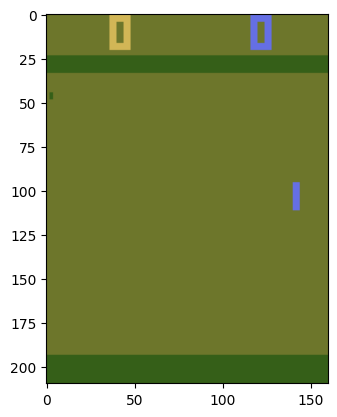

In [2]:
import matplotlib.pyplot as plt

state, info = env.reset()
print(state.shape, state.dtype)
plt.imshow(state);

## Preprocessing

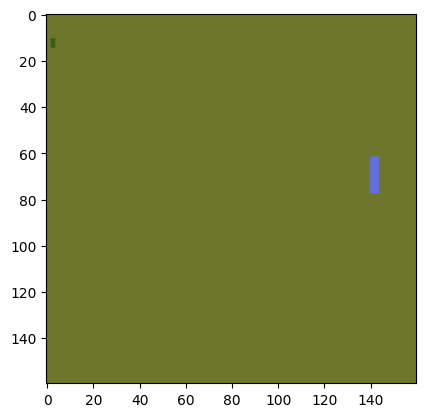

In [3]:
import numpy as np

def crop_frame(state: np.ndarray) -> np.ndarray:
    """Crop the frame to preserve only paddles and ball."""
    border_color = state[-1, -1]

    in_border = False
    for i, color in enumerate(state[:, 0]):
        if (color == border_color).all():
            in_border = True
        elif in_border:
            top_border_end = i
            break
    else:
        raise AssertionError("No top border end found.")
    
    for i, color in enumerate(state[::-1, 0]):
        if (color != border_color).any():
            bottom_border_end = len(state) - 1 - i
            break
    else:
        raise AssertionError("No bottom border end found")
    
    # TODO: crop area beyond reach of paddles?
    return state[top_border_end : bottom_border_end + 1]

cropped_frame = crop_frame(state)
plt.imshow(cropped_frame);

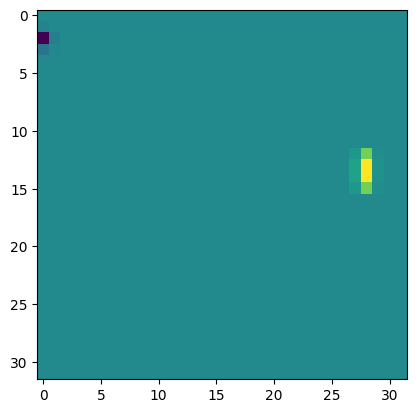

In [4]:
import torch
from torchvision.transforms.v2.functional import resize

def preprocess(frame: np.ndarray) -> torch.Tensor:
    """Crop, convert to grayscale, and size down the frame."""
    new_frame = crop_frame(frame)

    new_frame = np.dot(new_frame, [0.2989, 0.5870, 0.1140])  # TODO: cpu or gpu?

    new_frame = torch.tensor(new_frame[np.newaxis, ...])
    new_frame = resize(new_frame, (32, 32))
    return new_frame

processed_frame = preprocess(state)
plt.imshow(processed_frame[0]);

/home/gordonbchen/.cache/pypoetry/virtualenvs/pong-rl-e7cAghZA-py3.10/lib/python3.10/site-packages/gymnasium/utils/passive_env_checker.py:335: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(


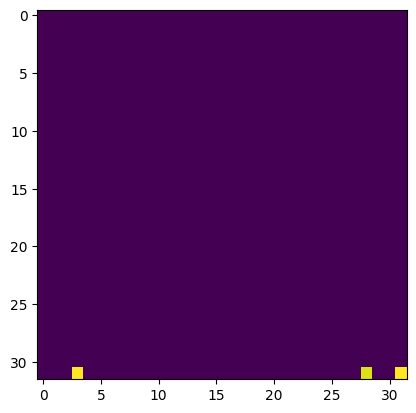

In [5]:
import matplotlib.animation as mpl_anim
from IPython.display import HTML
from typing import Callable

def get_frames(env: gym.Env) -> list[np.ndarray]:
    """Play a single episode and return frames."""
    state, info = env.reset()
    frames = [env.render()]

    while True:
        action = env.action_space.sample()
        new_state, reward, terminated, truncated, info = env.step(action)

        frames.append(env.render())
        if terminated or truncated:
            break

        state = new_state

        env.close()
    return frames

def show_episode(env: gym.Env, preprocess_func: Callable[[np.ndarray], np.ndarray] = None):
    """Show an episode of gameplay."""
    frames = get_frames(env)

    if preprocess_func:
        frames = [preprocess_func(frame) for frame in frames]

    fig, ax = plt.subplots()
    img = ax.imshow(frames[0])

    def update(frame: int):
        """Update the image."""
        img.set_data(frames[frame])
        return img

    anim = mpl_anim.FuncAnimation(fig=fig, func=update, frames=len(frames))
    return HTML(anim.to_jshtml())

show_episode(env, lambda x: preprocess(x)[0].numpy())